<a href="https://colab.research.google.com/github/sesael/predicting-diabetes-type/blob/main/final_project_diabetes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Diabetes Type Prediction



###Welcome to Edgardo's awesome notebook presentation (Enjoy the charming accent😜)

In [1]:
!pip install kaggle

In [235]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, make_scorer, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier

from flask import Flask, request, jsonify
from flask_ngrok import run_with_ngrok
import requests
import json

import joblib

In [3]:
from google.colab import files
kaggle_key = files.upload()

Saving kaggle.json to kaggle.json


In [7]:
!kaggle datasets download -d ankitbatra1210/diabetes-dataset
!unzip diabetes-dataset.zip

Dataset URL: https://www.kaggle.com/datasets/ankitbatra1210/diabetes-dataset
License(s): CC0-1.0
diabetes-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  diabetes-dataset.zip
  inflating: diabetes_dataset00.csv  


In [139]:
data = pd.read_csv('/content/diabetes_dataset00.csv')

In [9]:
data.tail()

,Target,Genetic Markers,Autoantibodies,Family History,Environmental Factors,Insulin Levels,Age,BMI,Physical Activity,Dietary Habits,...,Pulmonary Function,Cystic Fibrosis Diagnosis,Steroid Use History,Genetic Testing,Neurological Assessments,Liver Function Tests,Digestive Enzyme Levels,Urine Test,Birth Weight,Early Onset Symptoms
69995,Steroid-Induced Diabetes,Negative,Negative,Yes,Present,24,38,35,High,Unhealthy,...,71,Yes,Yes,Positive,2,Abnormal,34,Normal,2575,No
69996,LADA,Positive,Positive,No,Absent,21,51,31,Low,Unhealthy,...,82,Yes,Yes,Negative,1,Abnormal,58,Ketones Present,3002,No
69997,Type 1 Diabetes,Positive,Negative,No,Absent,18,11,15,Low,Unhealthy,...,77,Yes,Yes,Positive,2,Normal,53,Protein Present,3593,No
69998,Cystic Fibrosis-Related Diabetes (CFRD),Positive,Negative,No,Absent,32,30,24,High,Healthy,...,70,No,No,Positive,1,Abnormal,35,Ketones Present,2592,Yes
69999,LADA,Positive,Positive,Yes,Absent,27,41,28,Moderate,Healthy,...,84,No,Yes,Negative,2,Abnormal,64,Ketones Present,3593,Yes


In [103]:
print(f"The dataset has {data.shape[0]} columns and {data.shape[1]} rows.")

The dataset has 70000 columns and 34 rows.


#**Performing an EDA**

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 34 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Target                         70000 non-null  object
 1   Genetic Markers                70000 non-null  object
 2   Autoantibodies                 70000 non-null  object
 3   Family History                 70000 non-null  object
 4   Environmental Factors          70000 non-null  object
 5   Insulin Levels                 70000 non-null  int64 
 6   Age                            70000 non-null  int64 
 7   BMI                            70000 non-null  int64 
 8   Physical Activity              70000 non-null  object
 9   Dietary Habits                 70000 non-null  object
 10  Blood Pressure                 70000 non-null  int64 
 11  Cholesterol Levels             70000 non-null  int64 
 12  Waist Circumference            70000 non-null  int64 
 13  B

In [12]:
data.Target.unique()

array(['Steroid-Induced Diabetes', 'Neonatal Diabetes Mellitus (NDM)',
       'Prediabetic', 'Type 1 Diabetes', 'Wolfram Syndrome', 'LADA',
       'Type 2 Diabetes', 'Wolcott-Rallison Syndrome',
       'Secondary Diabetes', 'Type 3c Diabetes (Pancreatogenic Diabetes)',
       'Gestational Diabetes', 'Cystic Fibrosis-Related Diabetes (CFRD)',
       'MODY'], dtype=object)

<ipython-input-97-12cd44e63b93>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data.Target, palette = "viridis")


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, 'Steroid-Induced Diabetes'),
  Text(1, 0, 'Neonatal Diabetes Mellitus (NDM)'),
  Text(2, 0, 'Prediabetic'),
  Text(3, 0, 'Type 1 Diabetes'),
  Text(4, 0, 'Wolfram Syndrome'),
  Text(5, 0, 'LADA'),
  Text(6, 0, 'Type 2 Diabetes'),
  Text(7, 0, 'Wolcott-Rallison Syndrome'),
  Text(8, 0, 'Secondary Diabetes'),
  Text(9, 0, 'Type 3c Diabetes (Pancreatogenic Diabetes)'),
  Text(10, 0, 'Gestational Diabetes'),
  Text(11, 0, 'Cystic Fibrosis-Related Diabetes (CFRD)'),
  Text(12, 0, 'MODY')])

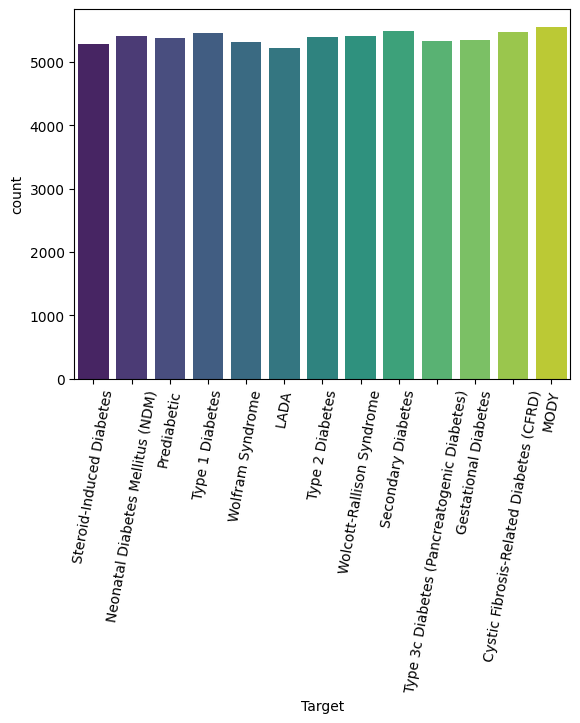

In [97]:
sns.countplot(x=data.Target, palette = "viridis")
plt.xticks(rotation=80)

In [46]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Insulin Levels,70000.0,21.607443,10.785852,5.0,13.0,19.0,28.00,49.0
Age,70000.0,32.020700,21.043173,0.0,14.0,31.0,49.00,79.0
BMI,70000.0,24.782943,6.014236,12.0,20.0,25.0,29.00,39.0
Blood Pressure,70000.0,111.339543,19.945000,60.0,99.0,113.0,125.00,149.0
Cholesterol Levels,70000.0,194.867200,44.532466,100.0,163.0,191.0,225.00,299.0
Waist Circumference,70000.0,35.051657,6.803461,20.0,30.0,34.0,39.00,54.0
Blood Glucose Levels,70000.0,160.701657,48.165547,80.0,121.0,152.0,194.00,299.0
Weight Gain During Pregnancy,70000.0,15.496414,9.633096,0.0,7.0,16.0,22.00,39.0
Pancreatic Health,70000.0,47.564243,19.984683,10.0,32.0,46.0,64.00,99.0
Pulmonary Function,70000.0,70.264671,11.965600,30.0,63.0,72.0,79.00,89.0


In [140]:
num_columns = [i for i in data.describe().columns]
num_columns

['Insulin Levels',
 'Age',
 'BMI',
 'Blood Pressure',
 'Cholesterol Levels',
 'Waist Circumference',
 'Blood Glucose Levels',
 'Weight Gain During Pregnancy',
 'Pancreatic Health',
 'Pulmonary Function',
 'Neurological Assessments',
 'Digestive Enzyme Levels',
 'Birth Weight']

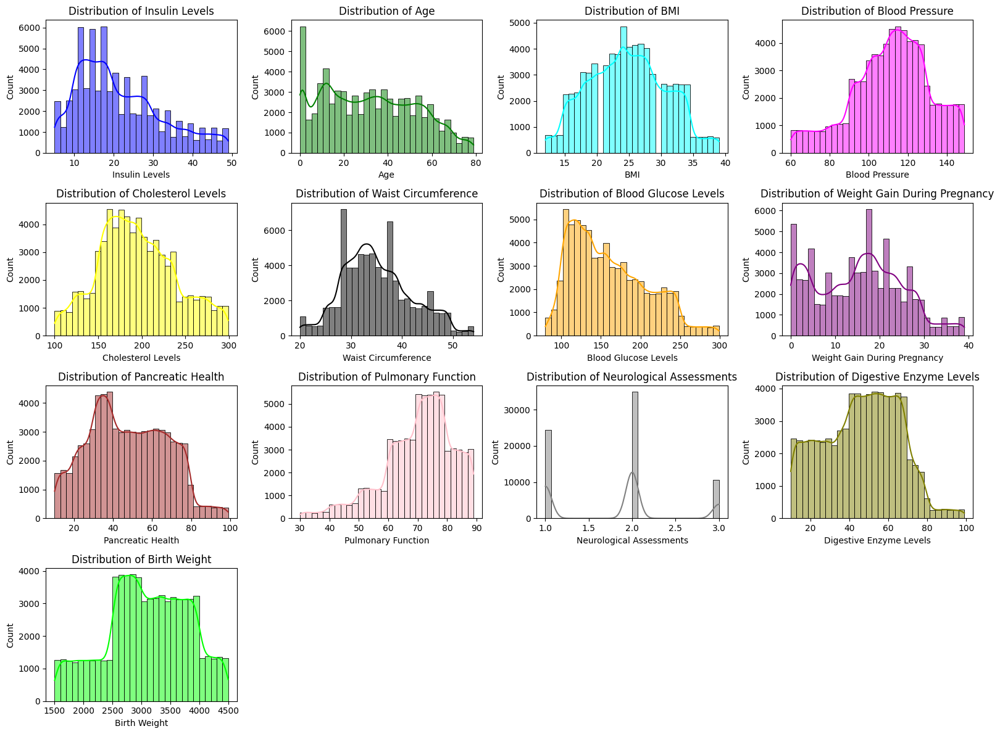

In [44]:
#Visualizing distributions of numerical columns

#Plotting histograms for each numerical column to visualize distributions

colors = ['blue','green','cyan','magenta','yellow','black','orange','purple',
          'brown','pink','gray','olive','lime','navy','teal','gold','indigo',
          'violet','turquoise']
color = 0

plt.figure(figsize=(16, 12))

for i, column in enumerate(num_columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(data[column], kde=True, bins=30, color=colors[color])
    color += 1
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

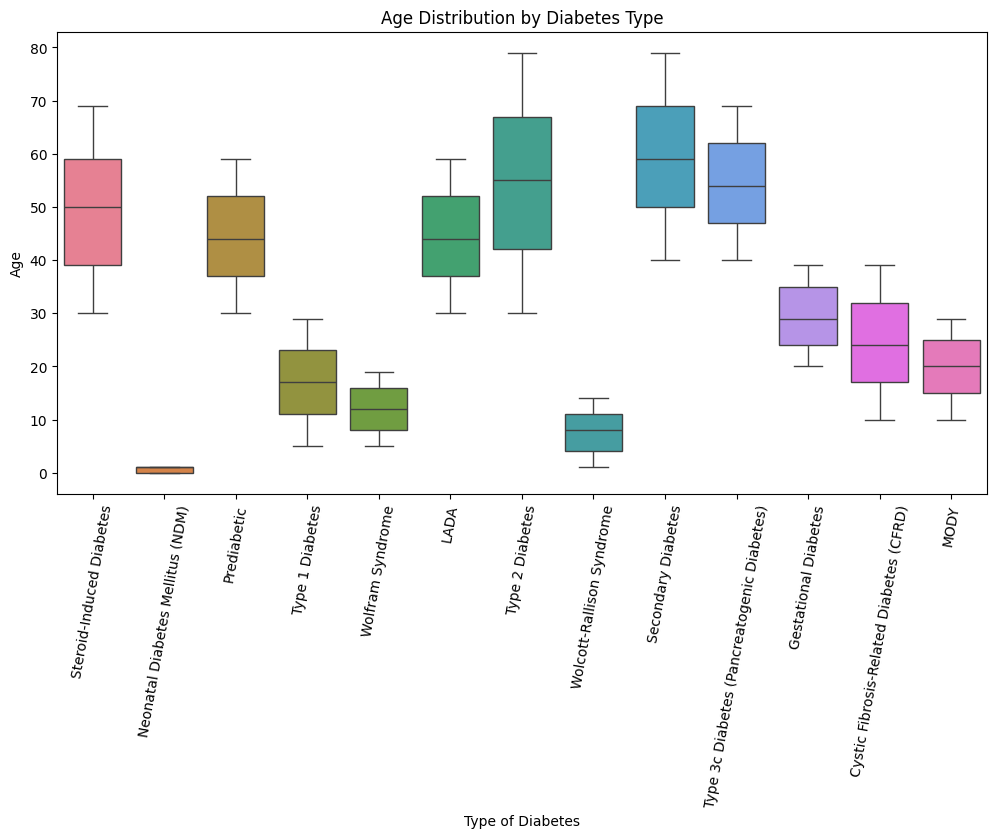

In [186]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Target', y='Age', data=data, hue="Target")
plt.title('Age Distribution by Diabetes Type')
plt.xticks(rotation=80)
plt.xlabel('Type of Diabetes')
plt.ylabel('Age')
plt.show()

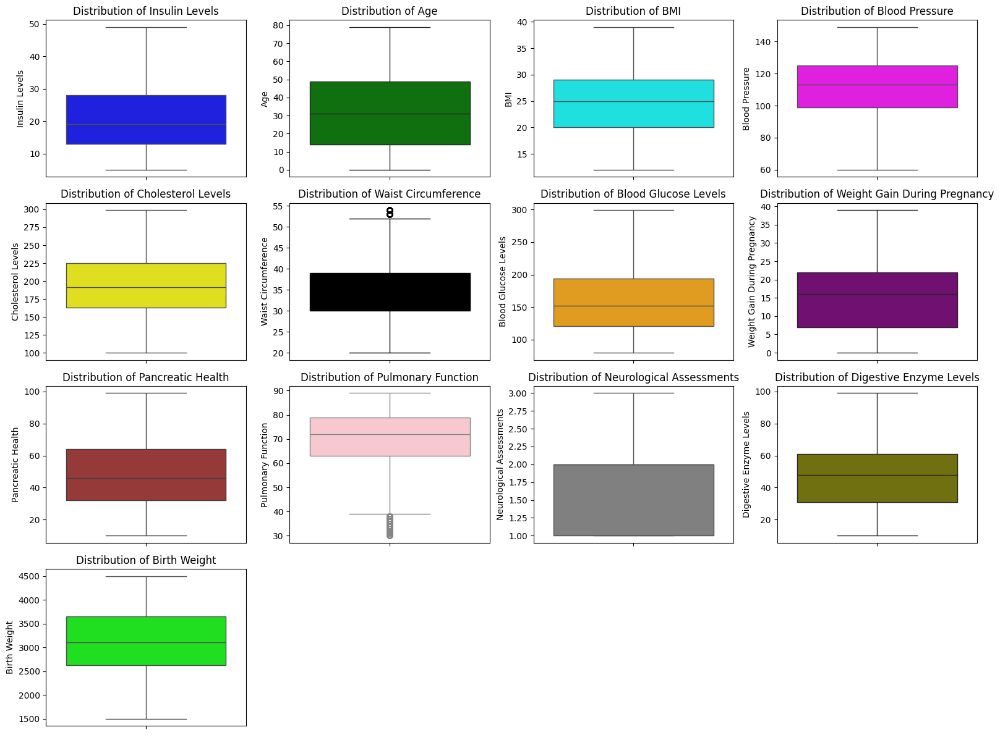

In [106]:
colors = ['blue','green','cyan','magenta','yellow','black','orange','purple',
          'brown','pink','gray','olive','lime','navy','teal','gold','indigo',
          'violet','turquoise']
color = 0

plt.figure(figsize=(16, 12))

for i, column in enumerate(num_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(data[column], color=colors[color])
    color += 1
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

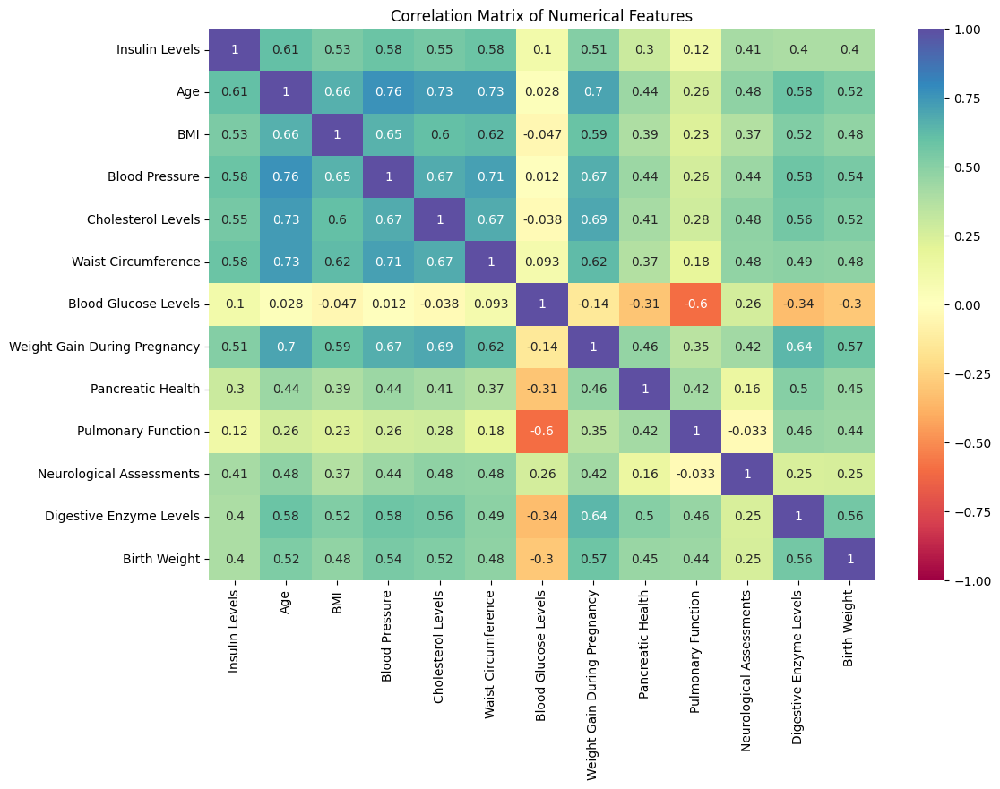

In [57]:
#Correlation matrix
corr_matrix = data[num_columns].corr()

# Visualizing the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='Spectral', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

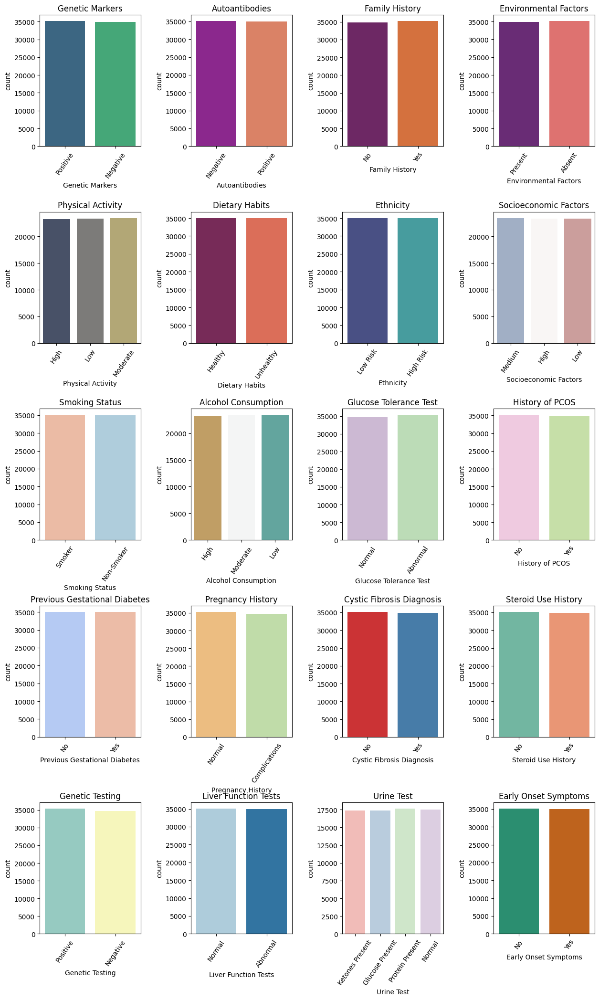

In [141]:
#Visualizing distributions of categorical columns
  #All but the Target since we already saw its distribution before

cat_columns = [i for i in data.select_dtypes("O").columns]

num_rows = 5
num_cols = 4

palettes = ['viridis','plasma','inferno','magma','cividis','rocket','mako','vlag','RdBu',
             'BrBG','PRGn' ,'PiYG','coolwarm','Spectral','Set1','Set2','Set3','Paired',
             'Pastel1','Dark2','cubehelix']

# Creating figure and axes for the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 25),gridspec_kw={'hspace': .5,'wspace': .5})
axes = axes.flatten()

palette = 0
for i, col in enumerate(cat_columns[1:]):
    sns.countplot(x=col, data=data, ax=axes[i],hue=col, palette = palettes[i], legend= False)
    palette += 1
    axes[i].set_title(f'{col}')
    axes[i].tick_params(axis='x', rotation=55)

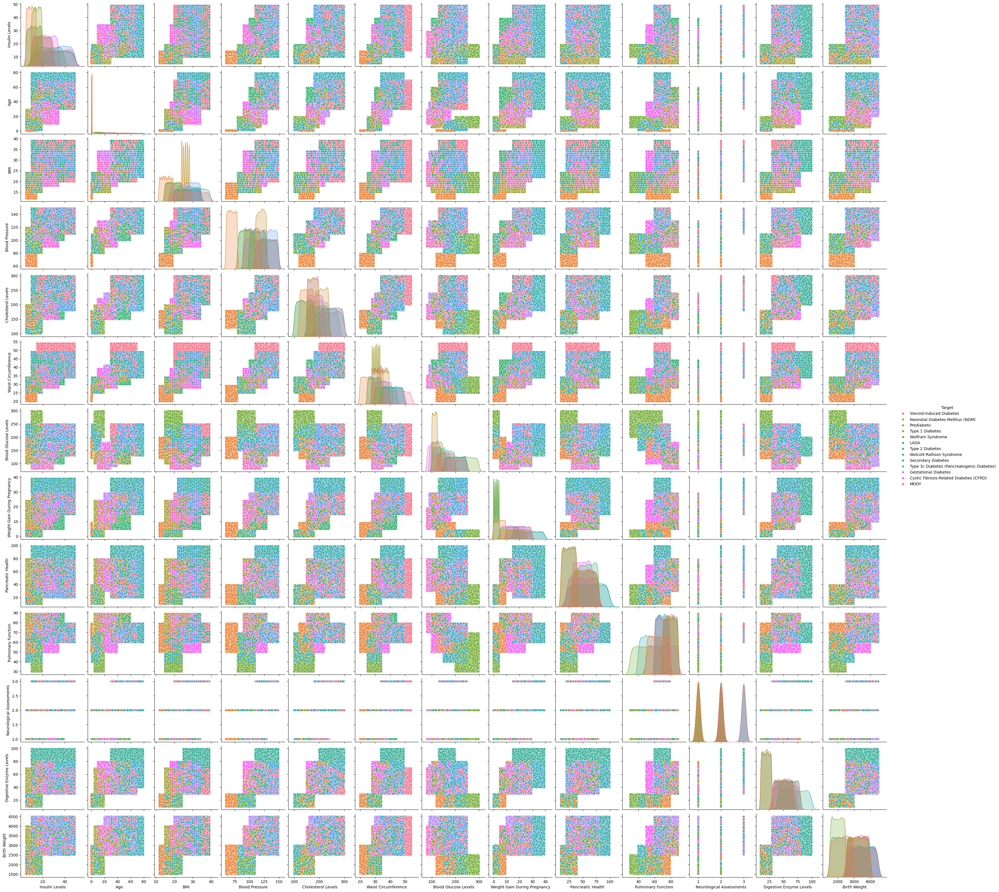

In [117]:
sns.pairplot(data = data, hue="Target")

#**Model Selection and Training**

In [142]:
#Using LabelEncoder for simplicity since there are no high-cardinality columns

label_encoders = {}
for col in cat_columns[1:]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

In [143]:
#Splitting the dataset into features and target

X = data.drop(columns=['Target'])  # Features
y = data['Target']  # Target (Diabetes type)

In [121]:
#Encoding the target variable using LabelEncoder

target_encoder = LabelEncoder()
y = target_encoder.fit_transform(y)

In [144]:
#Splitting the data into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [145]:
#Scaling the Numerical Features

scaler = StandardScaler()
X_train[num_columns] = scaler.fit_transform(X_train[num_columns])
X_test[num_columns] = scaler.transform(X_test[num_columns])

###**Model Training and Evaluation**

In [147]:
#Defining a function to train, evaluate, and store results

#Result storing
model_names = []
accuracy_scores = []
f1_scores = []
classification_reports = {}

#Function to train, evaluate, and store results

def train_and_evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Store results for plotting
    model_names.append(model.__class__.__name__)
    accuracy_scores.append(accuracy_score(y_test, y_pred))
    f1_scores.append(f1_score(y_test, y_pred, average='macro'))
    classification_reports[model.__class__.__name__] = classification_report(y_test, y_pred, target_names=target_encoder.classes_, output_dict=True)

    print(f"Model: {model.__class__.__name__}")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("F1 Score (macro):", f1_score(y_test, y_pred, average='macro'))
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=target_encoder.classes_))
    print('-' * 80)

In [149]:
#Defining a function to train, evaluate, and store results

#Result storing
model_names = []
accuracy_scores = []
f1_scores = []
classification_reports = {}

#Function to train, evaluate, and store results

def train_and_evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Store results for plotting
    model_names.append(model.__class__.__name__)
    accuracy_scores.append(accuracy_score(y_test, y_pred))
    f1_scores.append(f1_score(y_test, y_pred, average='macro'))

    # Ensure target_encoder.classes_ returns a list of strings
    target_names = [str(cls) for cls in target_encoder.classes_]

    classification_reports[model.__class__.__name__] = classification_report(y_test, y_pred, target_names=target_names, output_dict=True)

    print(f"Model: {model.__class__.__name__}")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("F1 Score (macro):", f1_score(y_test, y_pred, average='macro'))
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=target_names))
    print('-' * 80)


In [154]:
#Initialize and train different models

models = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'XGBoost': XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
    }

for model_name, model in models.items():
    if model_name == "Random Forest":
        train_and_evaluate_model(model, X_train, X_test, y_train, y_test)
    else:
        # Convert y_train and y_test to numeric values if they are not already
        y_train_encoded = target_encoder.fit_transform(y_train) #Fit the encoder on y_train before transforming
        y_test_encoded = target_encoder.transform(y_test)
        train_and_evaluate_model(model, X_train, X_test, y_train_encoded, y_test_encoded)


Model: RandomForestClassifier
Accuracy: 0.9035714285714286
F1 Score (macro): 0.9026262456306255
Classification Report:
                                            precision    recall  f1-score   support

   Cystic Fibrosis-Related Diabetes (CFRD)       0.99      0.91      0.95      1093
                      Gestational Diabetes       0.90      0.93      0.91      1069
                                      LADA       0.96      0.92      0.94      1044
                                      MODY       0.96      0.83      0.89      1111
          Neonatal Diabetes Mellitus (NDM)       1.00      1.00      1.00      1082
                               Prediabetic       0.96      1.00      0.98      1075
                        Secondary Diabetes       0.80      0.79      0.80      1096
                  Steroid-Induced Diabetes       0.83      0.83      0.83      1055
                           Type 1 Diabetes       0.85      1.00      0.92      1089
                           Type 2 Diabet

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [00:20:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Model: XGBClassifier
Accuracy: 0.9024285714285715
F1 Score (macro): 0.9016478727679276
Classification Report:
                                            precision    recall  f1-score   support

   Cystic Fibrosis-Related Diabetes (CFRD)       0.98      0.93      0.96      1093
                      Gestational Diabetes       0.92      0.94      0.93      1069
                                      LADA       0.97      0.93      0.95      1044
                                      MODY       0.92      0.87      0.89      1111
          Neonatal Diabetes Mellitus (NDM)       1.00      1.00      1.00      1082
                               Prediabetic       0.96      1.00      0.98      1075
                        Secondary Diabetes       0.81      0.77      0.79      1096
                  Steroid-Induced Diabetes       0.83      0.80      0.82      1055
                           Type 1 Diabetes       0.87      0.95      0.91      1089
                           Type 2 Diabetes       

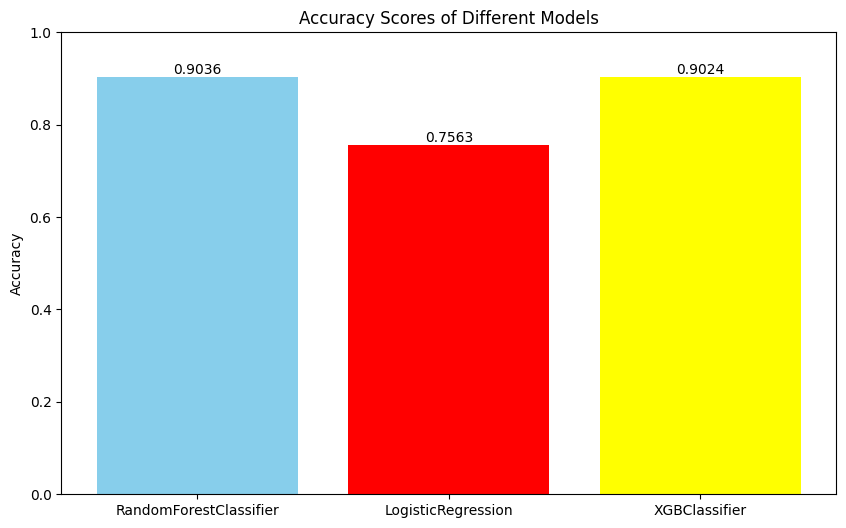

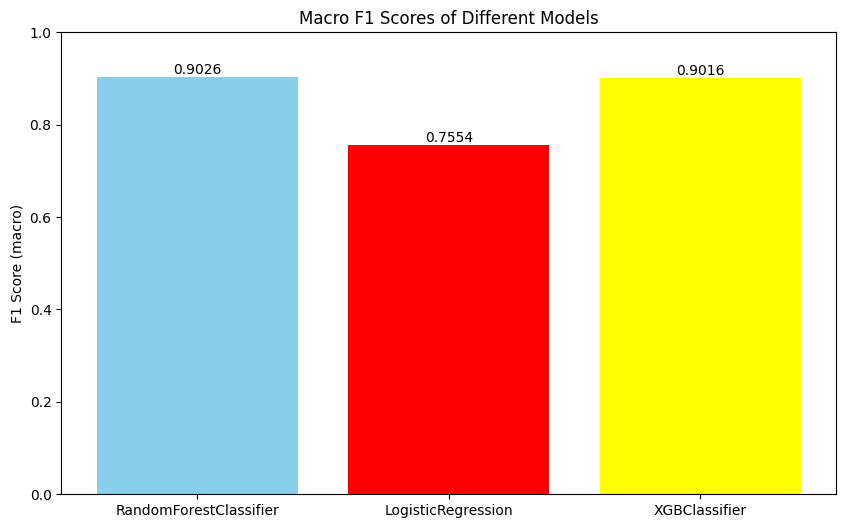

In [177]:
# Plotting the Accuracy and F1 scores

acc_score_list = [accuracy_scores[i] for i in [0, 1, -1]]
model_name_list = [model_names[i] for i in [0, 1, -1]]
f1_scores_list = [f1_scores[i] for i in [0, 1, -1]]

# Accuracy Bar Chart
plt.figure(figsize=(10, 6))
plt.bar(model_name_list, acc_score_list, color=['skyblue', "red", "yellow"])
plt.title('Accuracy Scores of Different Models')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
for i, v in enumerate(acc_score_list):
    plt.text(i, v, str(round(v,4)), ha='center', va='bottom')
plt.show()

# F1-Score Bar Chart
plt.figure(figsize=(10, 6))
plt.bar(model_name_list, f1_scores_list, color=['skyblue', "red", "yellow"])
plt.title('Macro F1 Scores of Different Models')
plt.ylabel('F1 Score (macro)')
plt.ylim([0, 1])
for i, v in enumerate(f1_scores_list):
    plt.text(i, v, str(round(v,4)), ha='center', va='bottom')
plt.show()

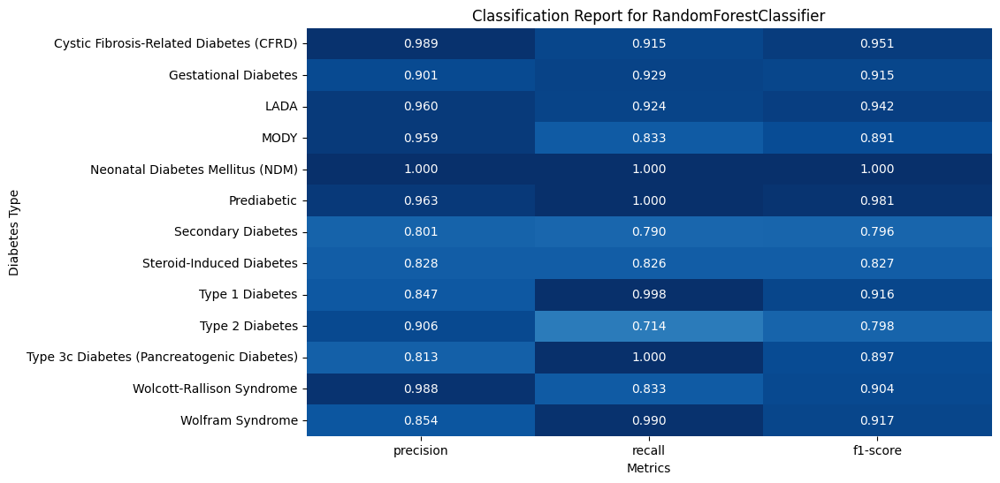

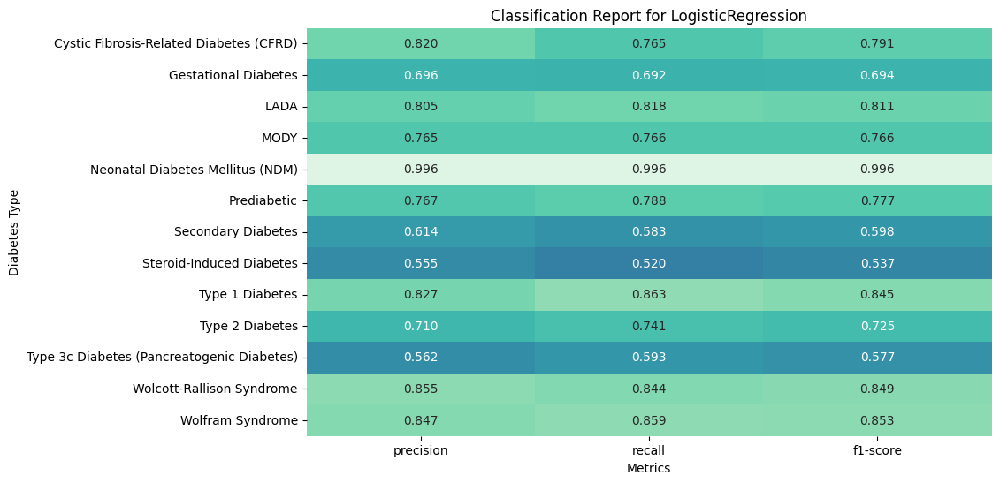

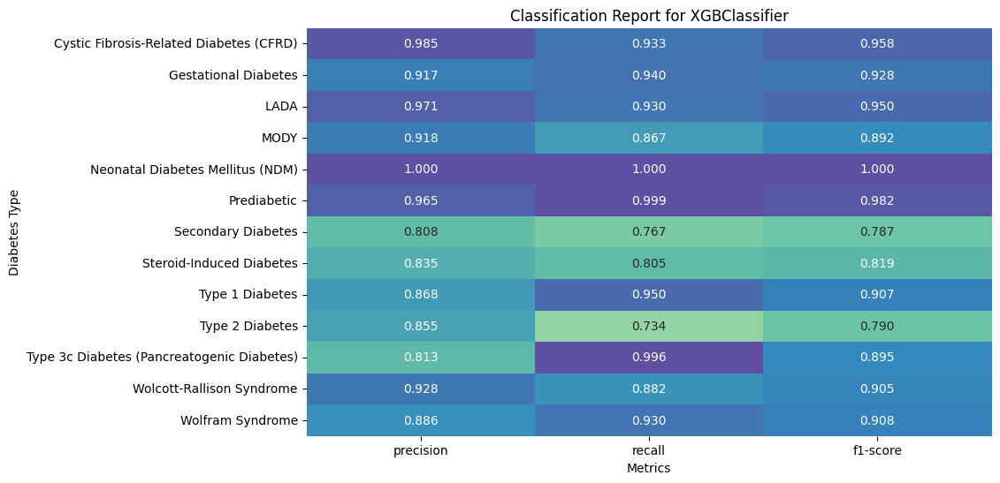

In [181]:
#Plotting Classification Report as Heatmaps for each model

cmaps = ['Blues', 'mako', 'Spectral']
cmap_count = 0

for model_name, report in classification_reports.items():
    # Extract precision, recall, and F1-score for each class from the classification report
    metrics_df = pd.DataFrame(report).transpose().iloc[:-3, :3]  # Exclude 'accuracy', 'macro avg', and 'weighted avg'

    plt.figure(figsize=(10, 6))
    sns.heatmap(metrics_df, annot=True, cmap=cmaps[cmap_count], cbar=False, fmt='.3f',vmin=0)
    cmap_count += 1
    plt.title(f'Classification Report for {model_name}')
    plt.xlabel('Metrics')
    plt.ylabel('Diabetes Type')
    plt.show()

#**Hyperparameter tuning**

In [188]:
#Hyperparameter Tuning for Random Forest

f1_scorer = make_scorer(f1_score, average='macro')

# Defining the parameter grid for Random Forest

rf_param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

In [192]:
# Initializing the Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Setting up RandomizedSearchCV for Random Forest

rf_random_search = RandomizedSearchCV(estimator=rf_model,
                                      param_distributions=rf_param_grid,
                                      n_iter=20, cv=3, verbose=2,
                                      random_state=42, n_jobs=-1,
                                      scoring=f1_scorer)

# Fitting the model to the training data

rf_random_search.fit(X_train, y_train)

#Best parameters for Random Forest

rf_random_search.best_params_


Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan]
  warnings.warn(


{'n_estimators': 100,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_depth': 30,
 'bootstrap': False}

In [194]:
#Hyperparameter Tuning for XGBoost
xgb_param_grid = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 5, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3]
}

In [196]:
# Initializing the XGBoost model
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Set up RandomizedSearchCV for XGBoost
xgb_random_search = RandomizedSearchCV(estimator=xgb_model, param_distributions=xgb_param_grid,
                                       n_iter=20, cv=3, verbose=2, random_state=42, n_jobs=-1, scoring=f1_scorer)

# Fit the model to the training data
xgb_random_search.fit(X_train, y_train_encoded)

#Best parameters and best F1 score for XGBoost

xgb_random_search.best_params_


Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:02:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


{'subsample': 0.8,
 'n_estimators': 200,
 'max_depth': 10,
 'learning_rate': 0.01,
 'gamma': 0.3,
 'colsample_bytree': 0.6}

In [199]:
#Retraining the Random Forest model using the best parameters

best_rf_model = RandomForestClassifier(**rf_random_search.best_params_, random_state=42)
best_rf_model.fit(X_train, y_train)

#Predicting on the test set

rf_y_pred = best_rf_model.predict(X_test)

#Evaluating Random Forest on the test set

print("Random Forest Results with Best Parameters:")
print("Accuracy:", accuracy_score(y_test, rf_y_pred))
print("F1 Score (macro):", f1_score(y_test, rf_y_pred, average='macro'))
print("Classification Report:")
print(classification_report(y_test, rf_y_pred, target_names=target_encoder.classes_))
print('-' * 80)

#Retraining the XGBoost model using the best parameters

best_xgb_model = XGBClassifier(**xgb_random_search.best_params_, random_state=42, use_label_encoder=False, eval_metric='mlogloss')
best_xgb_model.fit(X_train, y_train_encoded)

#Predicting on the test set

xgb_y_pred = best_xgb_model.predict(X_test)

#Evaluating XGBoost on the test set

print("XGBoost Results with Best Parameters:")
print("Accuracy:", accuracy_score(y_test_encoded, xgb_y_pred))
print("F1 Score (macro):", f1_score(y_test_encoded, xgb_y_pred, average='macro'))
print("Classification Report:")
print(classification_report(y_test_encoded, xgb_y_pred, target_names=target_encoder.classes_))

Random Forest Results with Best Parameters:
Accuracy: 0.9045714285714286
F1 Score (macro): 0.9036131872859817
Classification Report:
                                            precision    recall  f1-score   support

   Cystic Fibrosis-Related Diabetes (CFRD)       1.00      0.92      0.96      1093
                      Gestational Diabetes       0.90      0.94      0.92      1069
                                      LADA       0.97      0.93      0.95      1044
                                      MODY       0.96      0.83      0.89      1111
          Neonatal Diabetes Mellitus (NDM)       1.00      1.00      1.00      1082
                               Prediabetic       0.96      1.00      0.98      1075
                        Secondary Diabetes       0.80      0.78      0.79      1096
                  Steroid-Induced Diabetes       0.82      0.83      0.82      1055
                           Type 1 Diabetes       0.84      1.00      0.91      1089
                          

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:13:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Results with Best Parameters:
Accuracy: 0.9084285714285715
F1 Score (macro): 0.9073942520798285
Classification Report:
                                            precision    recall  f1-score   support

   Cystic Fibrosis-Related Diabetes (CFRD)       1.00      0.93      0.96      1093
                      Gestational Diabetes       0.91      0.96      0.94      1069
                                      LADA       0.99      0.92      0.95      1044
                                      MODY       0.97      0.83      0.89      1111
          Neonatal Diabetes Mellitus (NDM)       1.00      1.00      1.00      1082
                               Prediabetic       0.96      1.00      0.98      1075
                        Secondary Diabetes       0.81      0.79      0.80      1096
                  Steroid-Induced Diabetes       0.81      0.87      0.84      1055
                           Type 1 Diabetes       0.84      1.00      0.92      1089
                           Type 

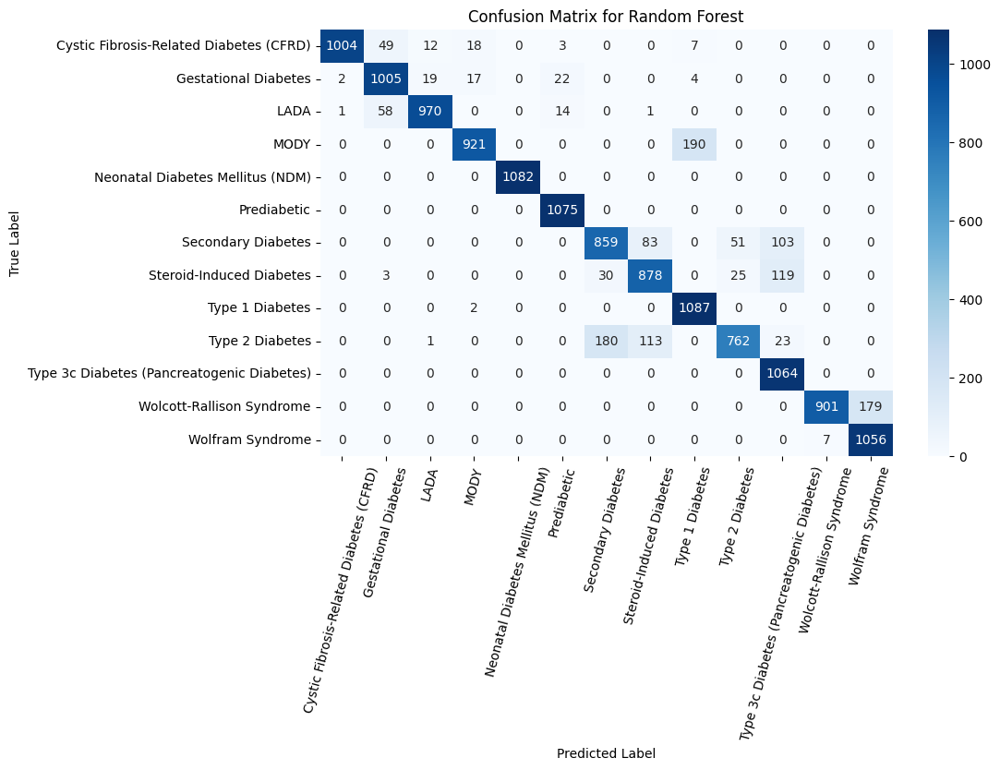

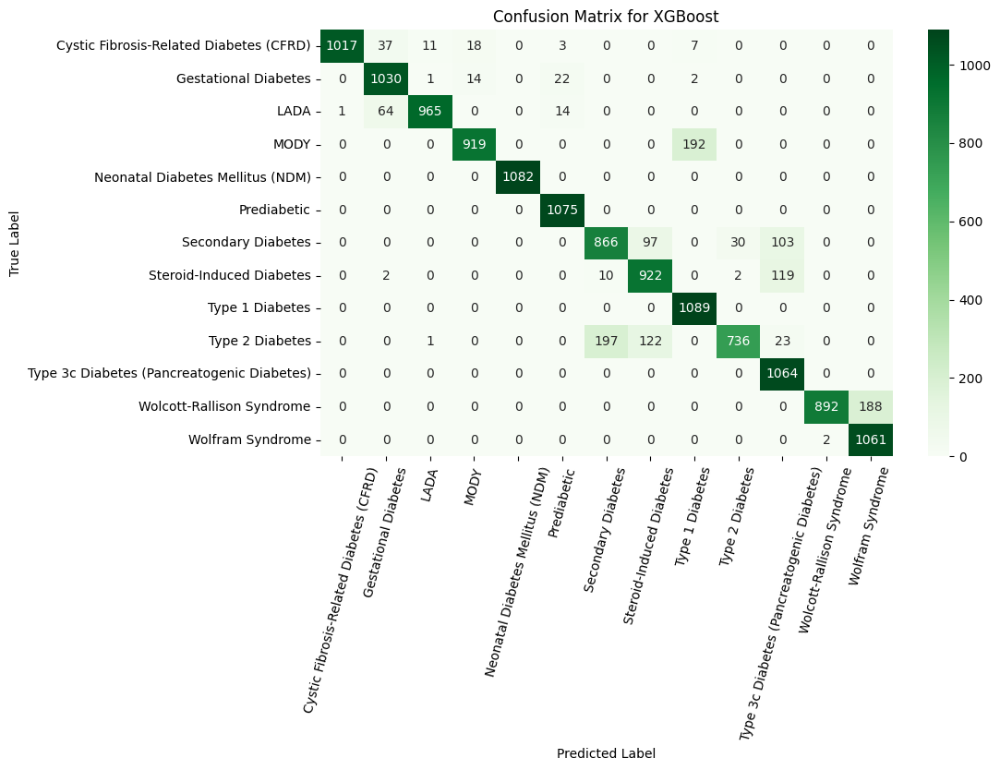

In [204]:
#Confusion Matrix for Random Forest

rf_conf_matrix = confusion_matrix(y_test, rf_y_pred)

plt.figure(figsize=(10, 6))
sns.heatmap(rf_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=target_encoder.classes_, yticklabels=target_encoder.classes_)
plt.title('Confusion Matrix for Random Forest')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=75)
plt.show()

#Confusion Matrix for XGBoost

xgb_conf_matrix = confusion_matrix(y_test_encoded, xgb_y_pred)

plt.figure(figsize=(10, 6))
sns.heatmap(xgb_conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=target_encoder.classes_, yticklabels=target_encoder.classes_)
plt.title('Confusion Matrix for XGBoost')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=75)
plt.show()

In [213]:
#Random Forest

print("Random Forest Results with Best Parameters:")
rf_accuracy = accuracy_score(y_test, rf_y_pred)
rf_f1 = f1_score(y_test, rf_y_pred, average='macro')
print(f"Accuracy: {rf_accuracy}")
print(f"F1 Score (macro): {rf_f1}")
print("Classification Report:")
print(classification_report(y_test, rf_y_pred, target_names=target_encoder.classes_))

print('-' * 80)

#XGBoost

print("XGBoost Results with Best Parameters:")
xgb_accuracy = accuracy_score(y_test_encoded, xgb_y_pred)
xgb_f1 = f1_score(y_test_encoded, xgb_y_pred, average='macro')
print(f"Accuracy: {xgb_accuracy}")
print(f"F1 Score (macro): {xgb_f1}")
print("Classification Report:")
print(classification_report(y_test_encoded, xgb_y_pred, target_names=target_encoder.classes_))

Random Forest Results with Best Parameters:
Accuracy: 0.9045714285714286
F1 Score (macro): 0.9036131872859817
Classification Report:
                                            precision    recall  f1-score   support

   Cystic Fibrosis-Related Diabetes (CFRD)       1.00      0.92      0.96      1093
                      Gestational Diabetes       0.90      0.94      0.92      1069
                                      LADA       0.97      0.93      0.95      1044
                                      MODY       0.96      0.83      0.89      1111
          Neonatal Diabetes Mellitus (NDM)       1.00      1.00      1.00      1082
                               Prediabetic       0.96      1.00      0.98      1075
                        Secondary Diabetes       0.80      0.78      0.79      1096
                  Steroid-Induced Diabetes       0.82      0.83      0.82      1055
                           Type 1 Diabetes       0.84      1.00      0.91      1089
                          

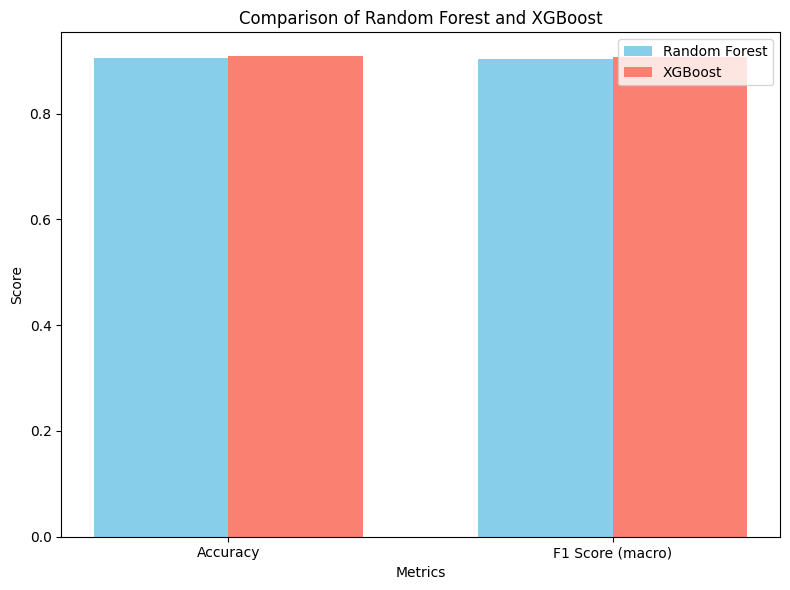

In [214]:
#Plotting Accuracy and F1 Score for Random Forest vs. XGBoost

metrics = ['Accuracy', 'F1 Score (macro)']
rf_metrics = [rf_accuracy, rf_f1]
xgb_metrics = [xgb_accuracy, xgb_f1]

plt.figure(figsize=(8, 6))

bar_width = 0.35
index = np.arange(len(metrics))

#Random Forest bars

plt.bar(index, rf_metrics, bar_width, label='Random Forest', color='skyblue')

#XGBoost bars

plt.bar(index + bar_width, xgb_metrics, bar_width, label='XGBoost', color='salmon')

#Labels and Titles

plt.xlabel('Metrics')
plt.ylabel('Score')
plt.title('Comparison of Random Forest and XGBoost')
plt.xticks(index + bar_width / 2, metrics)
plt.legend()

plt.tight_layout()
plt.show()

XGBoost seems to be a slightly better model

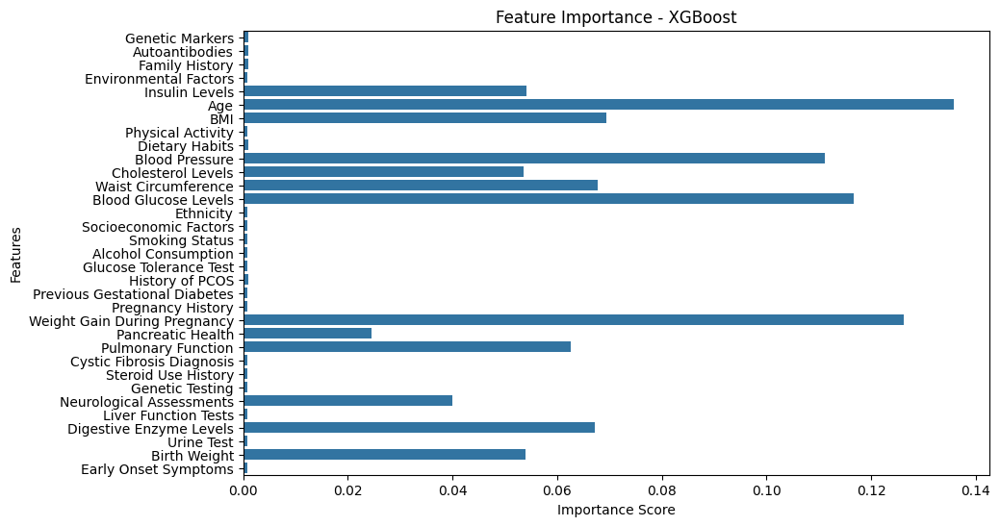

In [216]:
#Feature importance from XGBoost

xgb_feature_importance = best_xgb_model.feature_importances_

#Plotting feature importance

plt.figure(figsize=(10, 6))
sns.barplot(x=xgb_feature_importance, y=X.columns)
plt.title("Feature Importance - XGBoost")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()

In [217]:
#Setting a threshold for feature importance (0.01 - value based on the feature importance plot)

importance_threshold = 0.01

#Selecting features above the threshold

important_features = X.columns[xgb_feature_importance > importance_threshold]

#Creating a new dataset with only important features

X_train_important = X_train[important_features]
X_test_important = X_test[important_features]

In [219]:
#Retraining XGBoost using only the important features

best_xgb_model.fit(X_train_important, y_train_encoded)

#Predicting on the test set with important features

xgb_y_pred_important = best_xgb_model.predict(X_test_important)

#Evaluating the model

xgb_accuracy_important = accuracy_score(y_test_encoded, xgb_y_pred_important)
xgb_f1_important = f1_score(y_test_encoded, xgb_y_pred_important, average='macro')

print(f"Accuracy with important features: {xgb_accuracy_important}")
print(f"F1 Score (macro) with important features: {xgb_f1_important}")

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:40:02] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy with important features: 0.9084285714285715
F1 Score (macro) with important features: 0.9073268291121968


In [221]:
#Creating the RFE object and rank each feature with XGBoost

rfe = RFE(estimator=best_xgb_model, n_features_to_select=10, step=1)  # Adjust n_features_to_select as needed
rfe.fit(X_train, y_train_encoded)

#Getting the features that were selected

important_features_rfe = X.columns[rfe.support_]

#Retraining the model with only the selected features

X_train_rfe = X_train[important_features_rfe]
X_test_rfe = X_test[important_features_rfe]

best_xgb_model.fit(X_train_rfe, y_train_encoded)
xgb_y_pred_rfe = best_xgb_model.predict(X_test_rfe)

#Evaluating the performance with the selected features

xgb_accuracy_rfe = accuracy_score(y_test_encoded, xgb_y_pred_rfe)
xgb_f1_rfe = f1_score(y_test_encoded, xgb_y_pred_rfe, average='macro')

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:42:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:43:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:43:46] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:44:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:44:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

In [222]:
print(f"Accuracy with RFE-selected features: {xgb_accuracy_rfe}")
print(f"F1 Score (macro) with RFE-selected features: {xgb_f1_rfe}")

Accuracy with RFE-selected features: 0.8951428571428571
F1 Score (macro) with RFE-selected features: 0.893935452792771


As the scores went down, lets try with a lower threshold

In [223]:
#Setting a lower threshold for feature importance (0.01)

importance_threshold = 0.01
important_features_threshold = X.columns[xgb_feature_importance > importance_threshold]

#Retraining the model with important features based on threshold

X_train_threshold = X_train[important_features_threshold]
X_test_threshold = X_test[important_features_threshold]

best_xgb_model.fit(X_train_threshold, y_train_encoded)
xgb_y_pred_threshold = best_xgb_model.predict(X_test_threshold)

# Evaluate the model with threshold-selected features
xgb_accuracy_threshold = accuracy_score(y_test_encoded, xgb_y_pred_threshold)
xgb_f1_threshold = f1_score(y_test_encoded, xgb_y_pred_threshold, average='macro')

print(f"Accuracy with Threshold-selected features: {xgb_accuracy_threshold}")
print(f"F1 Score (macro) with Threshold-selected features: {xgb_f1_threshold}")

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [03:58:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy with Threshold-selected features: 0.9084285714285715
F1 Score (macro) with Threshold-selected features: 0.9073268291121968


In [225]:
joblib.dump(best_xgb_model, 'final_xgboost_model.pkl')

['final_xgboost_model.pkl']

In [226]:
loaded_model = joblib.load('/content/final_xgboost_model.pkl')

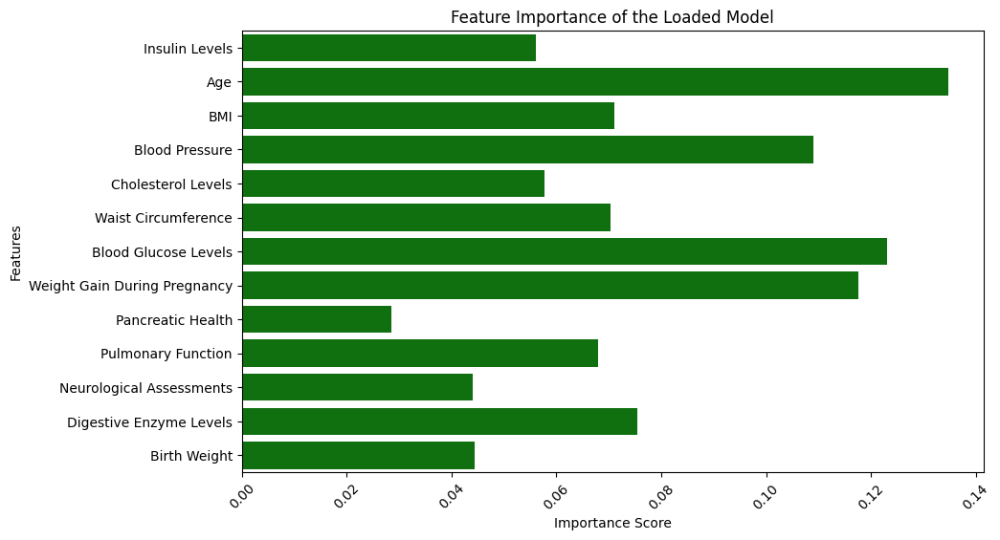

In [232]:
feature_importance = loaded_model.feature_importances_

# Ensure 'important_features_rfe' has the same length and order as features used for training
important_features_model = loaded_model.get_booster().feature_names
feature_importance = loaded_model.feature_importances_

# Plotting the feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance, y=important_features_model, color='green')
plt.xticks(rotation=45)
plt.title("Feature Importance of the Loaded Model")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()

#**Deploying the model with Flask**

In [233]:
!pip install flask-ngrok
!pip install flask

In [236]:
#Initializing Flask app
app = Flask(__name__)
run_with_ngrok(app)

#Defining an API route for prediction

@app.route('/predict', methods=['POST'])
def predict():
    # Getting the JSON request
    data = request.get_json(force=True)

    #Converting incoming JSON to DataFrame
    input_data = pd.DataFrame([data])  # Turn JSON into a DataFrame with one row

    #Making predictions using the loaded model
    predictions = model.predict(input_data)

    #Returning the predictions as JSON
    return jsonify({'predictions': predictions.tolist()})

#Running the Flask app
app.run()

 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
Exception in thread Thread-12:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/urllib3/connection.py", line 199, in _new_conn
    sock = connection.create_connection(
  File "/usr/local/lib/python3.10/dist-packages/urllib3/util/connection.py", line 85, in create_connection
    raise err
  File "/usr/local/lib/python3.10/dist-packages/urllib3/util/connection.py", line 73, in create_connection
    sock.connect(sa)
ConnectionRefusedError: [Errno 111] Connection refused

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/urllib3/connectionpool.py", line 789, in urlopen
    response = self._make_request(
  File "/usr/local/lib/python3.10/dist-packages/urll

In [ ]:
# Define the ngrok URL (replace <ngrok_id> with your actual ngrok ID)
url = 'http://<random_ngrok_id>.ngrok.io/predict'

# Example input data (should match the format of your model's training data)
data = {
    'Insulin Levels': 100,
    'Age': 21,
    'BMI': 34.5,
    'Blood Pressure': 80,
    'Cholesterol Levels': 180,
    'Waist Circumference': 115,
    # Add all other required features here in the correct format
}

# Send POST request to the Flask API
response = requests.post(url, json=data)

# Print the response (predictions)
print(response.json())